# Outlier detection methods with PYOD on the wine quality dataset

To see if it is possible to extract the best wines and worst wines through outlier detection

In [1]:
import re
import numpy
import matplotlib.pyplot as plt
import plotly_express as px
import umap

In [2]:
import pandas as pd
import pprint

In [3]:
from pyod.models.iforest import IForest
from pyod.models.knn import KNN

In [4]:
from lime.lime_tabular import LimeTabularExplainer
import shap

ModuleNotFoundError: No module named 'numpy.core._multiarray_umath'

## Read in data from csv

In [5]:
data = pd.read_csv("D:/NCS/repo/anomaly/data/winequality-white.csv", sep = ';')

In [6]:
# Summary statistics for the dataset
data.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000
mean,6.854788,0.278241,0.334192,6.391415,0.045772,35.308085,138.360657,0.994027,3.188267,0.489847,10.514267,5.877909
std,0.843868,0.100795,0.121020,5.072058,0.021848,17.007137,42.498065,0.002991,0.151001,0.114126,1.230621,0.885639
min,3.800000,0.080000,0.000000,0.600000,0.009000,2.000000,9.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.300000,0.210000,0.270000,1.700000,0.036000,23.000000,108.000000,0.991723,3.090000,0.410000,9.500000,5.000000
50%,6.800000,0.260000,0.320000,5.200000,0.043000,34.000000,134.000000,0.993740,3.180000,0.470000,10.400000,6.000000
75%,7.300000,0.320000,0.390000,9.900000,0.050000,46.000000,167.000000,0.996100,3.280000,0.550000,11.400000,6.000000
max,14.200000,1.100000,1.660000,65.800000,0.346000,289.000000,440.000000,1.038980,3.820000,1.080000,14.200000,9.000000


In [7]:
data_response = data['quality']
data.drop('quality', axis=1, inplace=True)

In [8]:
type(data_response)

pandas.core.series.Series

Get count of response

In [9]:
data_response.value_counts(sort=False).sort_index()

3      20
4     163
5    1457
6    2198
7     880
8     175
9       5
Name: quality, dtype: int64

## Visualize data with UMAP

In [10]:
reducer = umap.UMAP(n_neighbors=15, metric='euclidean', n_epochs=1000, random_state=100, verbose=True)

In [11]:
embedding = reducer.fit_transform(data)

UMAP(a=None, angular_rp_forest=False, b=None, init='spectral',
   learning_rate=1.0, local_connectivity=1.0, metric='euclidean',
   metric_kwds=None, min_dist=0.1, n_components=2, n_epochs=1000,
   n_neighbors=15, negative_sample_rate=5, random_state=100,
   repulsion_strength=1.0, set_op_mix_ratio=1.0, spread=1.0,
   target_metric='categorical', target_metric_kwds=None,
   target_n_neighbors=-1, target_weight=0.5, transform_queue_size=4.0,
   transform_seed=42, verbose=True)
Construct fuzzy simplicial set
	 0  /  12
	 1  /  12
	 2  /  12
Construct embedding
	completed  0  /  1000 epochs
	completed  100  /  1000 epochs
	completed  200  /  1000 epochs
	completed  300  /  1000 epochs
	completed  400  /  1000 epochs
	completed  500  /  1000 epochs
	completed  600  /  1000 epochs
	completed  700  /  1000 epochs
	completed  800  /  1000 epochs
	completed  900  /  1000 epochs


In [12]:
embedding.shape

(4898, 2)

In [13]:
UMAP_df = pd.DataFrame(embedding, columns = ['X1', 'X2'])

In [14]:
UMAP_df.head(5)

,X1,X2
0,7.852051,-0.313525
1,-2.351155,-7.504436
2,-7.371315,0.604246
3,9.579804,1.505345
4,9.580307,1.507996


In [15]:
UMAP_df['response'] = data_response.astype(str)

In [16]:
px.scatter(UMAP_df, x='X1', y='X2', color='response')

There seem to be two major clusters of wine and a few outliers but the outliers do not seem to indicate the best or the worst wines

## Outlier detection with Isolation Forest

In [17]:
# fit the model
clf = IForest(n_estimators=500,
              max_samples='auto',
              contamination=0.01,
              max_features=1.0, 
              bootstrap=False, 
              n_jobs=None, 
              random_state=42,
              verbose=0)

clf.fit(data)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\ensemble\iforest.py:223: FutureWarning:

behaviour="old" is deprecated and will be removed in version 0.22. Please use behaviour="new", which makes the decision_function change to match other anomaly detection algorithm API.

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



IForest(bootstrap=False, contamination=0.01, max_features=1.0,
    max_samples='auto', n_estimators=500, n_jobs=None, random_state=42,
    verbose=0)

In [18]:
y_pred = clf.predict(data)

In [19]:
pd.crosstab(y_pred, data_response, margins = True)

quality,3,4,5,6,7,8,9,All
row_0,,,,,,,,
0,17,158,1436,2186,873,175,5,4850
1,3,5,21,12,7,0,0,48
All,20,163,1457,2198,880,175,5,4898


### Get predicted probabilities

In [20]:
# Get original anomaly score
anomalies_score = clf.predict_proba(data, method ='unify')
anomalies_score_df = pd.DataFrame(anomalies_score, columns = ['non_outlier', 'outlier'])
anomalies_score_df.describe()

,non_outlier,outlier
count,4.898000e+03,4898.000000
mean,7.825168e-01,0.217483
std,3.265536e-01,0.326554
min,2.565113e-07,0.000000
25%,5.995194e-01,0.000000
50%,1.000000e+00,0.000000
75%,1.000000e+00,0.400481
max,1.000000e+00,1.000000


In [21]:
px.histogram(anomalies_score_df, 
             x = 'outlier', 
             y = 'outlier', 
             width=600, 
             height=300)

In [22]:
UMAP_df['prob'] = anomalies_score_df['outlier']

In [23]:
heat_cols = px.colors.colorbrewer.RdYlBu[::-1]

In [24]:
px.scatter(UMAP_df, x='X1', y='X2', color='prob', color_continuous_scale=heat_cols)

The isolation forest seems to select outliers at the edges of the plot but not in the small clusters

### Use LIME and SHAP for outlier explanations

In [25]:
anomalies_score_df.index[(anomalies_score_df['outlier'] > 0.9) & (anomalies_score_df['outlier'] < 0.99)].tolist()

[17,
 20,
 23,
 40,
 41,
 54,
 72,
 147,
 158,
 159,
 221,
 230,
 250,
 294,
 311,
 325,
 372,
 387,
 403,
 433,
 470,
 478,
 531,
 541,
 549,
 556,
 570,
 580,
 593,
 594,
 602,
 603,
 620,
 626,
 659,
 662,
 683,
 694,
 700,
 701,
 705,
 729,
 757,
 762,
 771,
 772,
 780,
 814,
 821,
 870,
 913,
 915,
 926,
 948,
 970,
 982,
 1007,
 1014,
 1016,
 1027,
 1029,
 1036,
 1057,
 1090,
 1099,
 1114,
 1126,
 1152,
 1171,
 1180,
 1185,
 1214,
 1263,
 1307,
 1332,
 1335,
 1352,
 1372,
 1373,
 1401,
 1415,
 1423,
 1454,
 1455,
 1482,
 1487,
 1489,
 1496,
 1534,
 1540,
 1559,
 1578,
 1580,
 1583,
 1596,
 1598,
 1599,
 1603,
 1651,
 1653,
 1663,
 1688,
 1727,
 1731,
 1732,
 1744,
 1758,
 1759,
 1807,
 1809,
 1842,
 1865,
 1900,
 1925,
 1926,
 1933,
 1950,
 1954,
 1958,
 1963,
 1995,
 1997,
 1998,
 2006,
 2014,
 2017,
 2025,
 2026,
 2050,
 2092,
 2106,
 2127,
 2164,
 2257,
 2259,
 2269,
 2279,
 2359,
 2371,
 2396,
 2403,
 2408,
 2412,
 2414,
 2417,
 2434,
 2579,
 2625,
 2646,
 2654,
 2704,
 2705,
 2721,
 2754,
 2862,
 2874,
 2893,
 2926,
 2930,
 2931,
 2945,
 2962,
 2990,
 3007,
 3008,
 3009,
 3014,
 3020,
 3023,
 3025,
 3052,
 3064,
 3066,
 3119,
 3150,
 3283,
 3288,
 3307,
 3388,
 3413,
 3420,
 3454,
 3458,
 3520,
 3523,
 3545,
 3547,
 3556,
 3587,
 3588,
 3589,
 3598,
 3619,
 3623,
 3635,
 3662,
 3664,
 3678,
 3694,
 3708,
 3754,
 3764,
 3873,
 3879,
 3902,
 4006,
 4014,
 4018,
 4039,
 4109,
 4123,
 4136,
 4213,
 4223,
 4253,
 4299,
 4300,
 4316,
 4350,
 4401,
 4430,
 4473,
 4497,
 4565,
 4567,
 4591,
 4597,
 4617,
 4649,
 4650,
 4671,
 4672,
 4679,
 4681,
 4696,
 4779,
 4787,
 4789,
 4813,
 4818,
 4820,
 4839,
 4841,
 4847,
 4877,
 4878,
 4883]

### Lime explanations

In [26]:
lime_explainer = LimeTabularExplainer(data.values, mode='classification', 
                                     class_names=['non-Outlier', 'Outlier'],
                                     feature_names=list(data.columns.values), 
                                     feature_selection = 'lasso_path',
                                     random_state=42, 
                                     discretize_continuous=True) 

In [27]:
exp = lime_explainer.explain_instance(data.iloc[20,:].values, 
                                     lambda x: clf.predict_proba(x, method = 'unify'), 
                                     num_features=10)

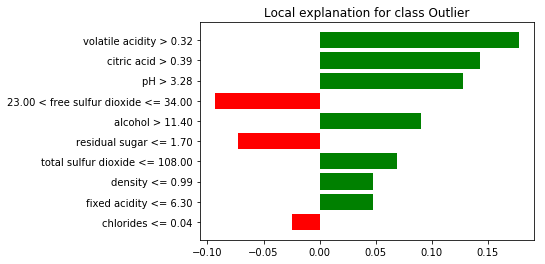

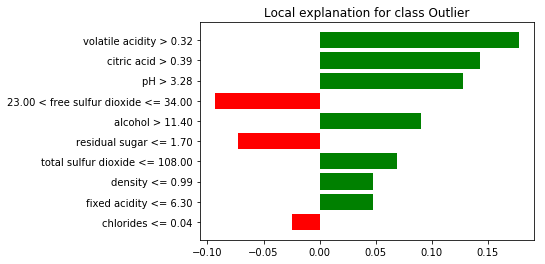

In [28]:
exp.as_pyplot_figure()

In [29]:
exp.show_in_notebook(show_table=True, show_all=True)

### SHAP explanations

In [30]:
shap.initjs()

In [31]:
# Summarize data with median
data_summary = data.median().values.reshape((1,data.shape[1]))

### SHAP explanations for single observation

In [32]:
import warnings
warnings.filterwarnings('ignore')

shap_explainer = shap.KernelExplainer(lambda x: clf.predict_proba(x, method = 'unify')[:,1], data_summary)

In [33]:
x_test = data.iloc[17,:]

shap_values_single = shap_explainer.shap_values(x_test, nsamples=1000)
shap.force_plot(shap_explainer.expected_value, shap_values_single, x_test)

### SHAP explanations (variable importance)

In [34]:
# Use train-test split to sample points for plotting
from sklearn.model_selection import train_test_split

_, data_sub, _, _= train_test_split(data, data_response, test_size=0.2, random_state=42, stratify=data_response)

In [35]:
data_sub.shape

(980, 11)

In [36]:
shap_values = shap_explainer.shap_values(data_sub, nsamples=100, l1_reg = 'aic')

100%|████████████████████████████████████████████████████████████████████████████████| 980/980 [04:28<00:00,  3.46it/s]


In [37]:
shap.force_plot(shap_explainer.expected_value, shap_values, data_sub)

There seem to be two types of outliers investigate particular values to check similarity

In [38]:
import scipy

D = scipy.spatial.distance.pdist(shap_values, 'sqeuclidean')
clustOrder = scipy.cluster.hierarchy.leaves_list(scipy.cluster.hierarchy.complete(D))

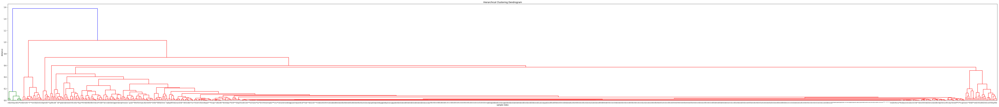

In [39]:
# calculate full dendrogram
plt.figure(figsize=(100, 10))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('sample index')
plt.ylabel('distance')
scipy.cluster.hierarchy.dendrogram(
    Z = scipy.cluster.hierarchy.complete(D)
)
plt.show()

In [40]:
cut_tree = scipy.cluster.hierarchy.cut_tree(scipy.cluster.hierarchy.complete(D), n_clusters=3)
cut_tree_df = pd.DataFrame(cut_tree)
cut_tree_df.iloc[:,0].value_counts()

0    946
1     20
2     14
Name: 0, dtype: int64

In [41]:
# Scale original data
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler(copy=True, with_mean=True, with_std=True)

data_scaled = scaler.fit(data).transform(data)
data_scaled_df = pd.DataFrame(data_scaled, columns = data.columns)

In [42]:
data_scaled_df.mean().round(2)

fixed acidity           0.0
volatile acidity        0.0
citric acid             0.0
residual sugar         -0.0
chlorides               0.0
free sulfur dioxide    -0.0
total sulfur dioxide    0.0
density                 0.0
pH                     -0.0
sulphates              -0.0
alcohol                -0.0
dtype: float64

In [43]:
data_scaled_df.std().round(2)

fixed acidity           1.0
volatile acidity        1.0
citric acid             1.0
residual sugar          1.0
chlorides               1.0
free sulfur dioxide     1.0
total sulfur dioxide    1.0
density                 1.0
pH                      1.0
sulphates               1.0
alcohol                 1.0
dtype: float64

In [44]:
# Index for subsample
grp1_index = numpy.where(cut_tree ==1)[0]
grp2_index = numpy.where(cut_tree ==2)[0]

In [45]:
# Get index for original data
grp1_index = data_sub.iloc[numpy.where(cut_tree ==1)[0], :].index
grp2_index = data_sub.iloc[numpy.where(cut_tree ==2)[0], :].index

In [46]:
grp1_index

Int64Index([4702, 2092, 3662, 4686, 4316, 1577,  268,  450, 1382,   17, 4877,
             626, 4597, 3097,  372, 1245, 4548,  948,   20, 4501],
           dtype='int64')

In [47]:
data_scaled_df.iloc[grp1_index,:].mean().round(2)

fixed acidity          -0.33
volatile acidity        3.58
citric acid            -0.87
residual sugar         -0.01
chlorides               0.18
free sulfur dioxide    -0.46
total sulfur dioxide   -0.25
density                 0.20
pH                      0.45
sulphates              -0.11
alcohol                -0.28
dtype: float64

In [48]:
data_scaled_df.iloc[grp2_index,:].mean().round(2)

fixed acidity           0.04
volatile acidity        0.56
citric acid             0.76
residual sugar         -0.19
chlorides               6.85
free sulfur dioxide     0.16
total sulfur dioxide    0.34
density                 0.35
pH                     -0.73
sulphates              -0.24
alcohol                -0.81
dtype: float64

In [49]:
outlier_grps_df = pd.DataFrame({
    'vars':data_scaled_df.columns,
    'grp1':data_scaled_df.iloc[grp1_index,:].mean().tolist(),
    'grp2':data_scaled_df.iloc[grp2_index,:].mean().tolist()
})

In [50]:
outlier_grps_df

,vars,grp1,grp2
0,fixed acidity,-0.325662,0.036652
1,volatile acidity,3.579516,0.563172
2,citric acid,-0.873430,0.756340
3,residual sugar,-0.014574,-0.188444
4,chlorides,0.179790,6.850591
5,free sulfur dioxide,-0.462093,0.156197
6,total sulfur dioxide,-0.249699,0.337782
7,density,0.202927,0.346961
8,pH,0.445298,-0.726530
9,sulphates,-0.112579,-0.242775


In [51]:
outlier_grps_df_long = pd.melt(outlier_grps_df,
                        id_vars=['vars'],
                        var_name='grp', 
                        value_name='values')

In [52]:
px.histogram(outlier_grps_df_long, 
             x='vars', 
             y='values', 
             color='grp', 
             barmode='relative',
             histfunc='avg',
             orientation='v',
             labels={'values':'Standardized Values',
                    'vars':'Features'})

### Global Variable importance using SHAP

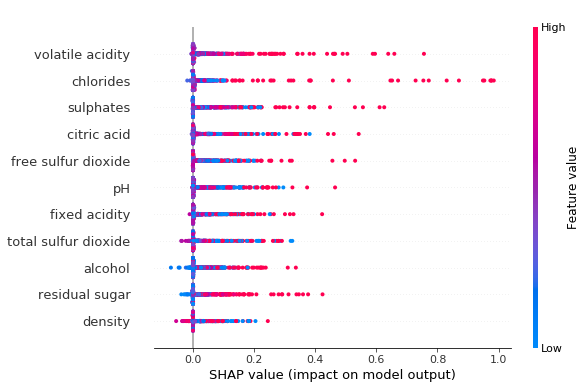

In [53]:
shap.summary_plot(shap_values, data_sub, plot_type='dot')

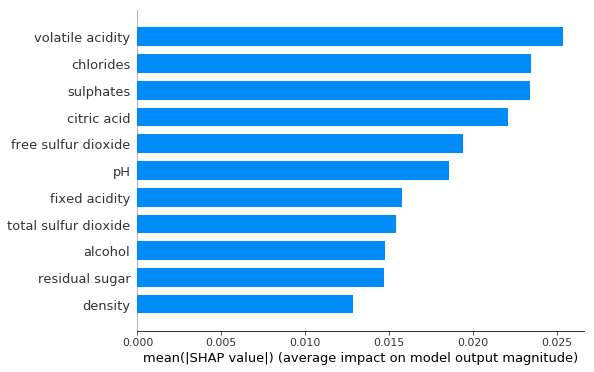

In [54]:
shap.summary_plot(shap_values, data_sub, plot_type='bar')